In [1]:
import keras
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import numpy as np
import pathlib
import glob
import os
import tqdm

from PIL import ImageFile, Image
ImageFile.LOAD_TRUNCATED_IMAGES = True

import tensorflow as tf
from tensorflow.compat.v1 import ConfigProto
from tensorflow.compat.v1 import InteractiveSession
config = ConfigProto()
config.gpu_options.allow_growth = True
sess = InteractiveSession(config=config)
tf.config.list_logical_devices('GPU')

[LogicalDevice(name='/device:GPU:0', device_type='GPU')]

In [2]:
model = keras.models.load_model('checkpoint/88/best_traffic.h5')
model.summary()

Model: "traffic_level_detector"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 96, 128, 3)]      0         
_________________________________________________________________
random_contrast (RandomContr (None, 96, 128, 3)        0         
_________________________________________________________________
conv2d (Conv2D)              (None, 94, 126, 32)       896       
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 92, 124, 32)       9248      
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 45, 61, 64)        18496     
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 22, 30, 64)        36928     
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 20, 28, 

  0%|          | 0/38 [00:00<?, ?it/s]

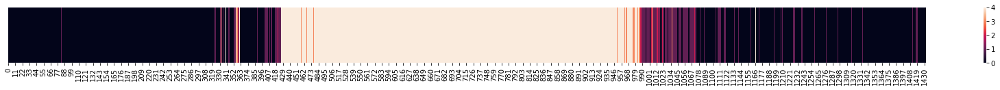

  3%|▎         | 1/38 [01:02<38:34, 62.56s/it]

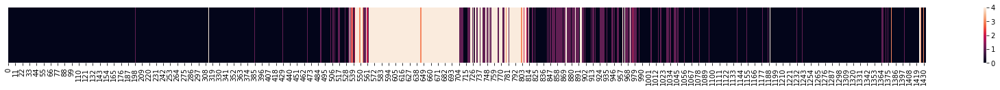

  5%|▌         | 2/38 [02:03<37:00, 61.67s/it]

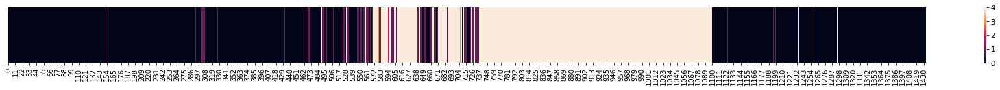

  8%|▊         | 3/38 [03:06<36:10, 62.01s/it]

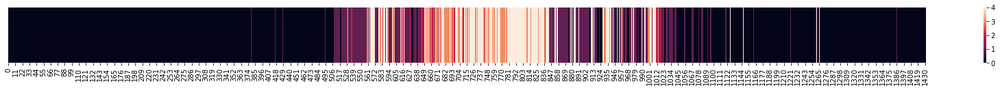

 11%|█         | 4/38 [04:07<35:02, 61.84s/it]

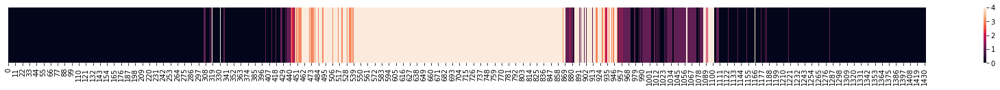

 13%|█▎        | 5/38 [05:09<33:56, 61.72s/it]

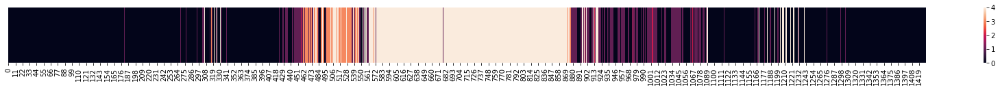

 16%|█▌        | 6/38 [06:10<32:51, 61.61s/it]

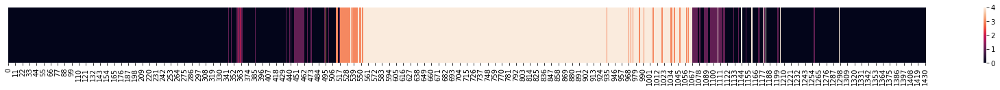

 18%|█▊        | 7/38 [07:03<30:27, 58.95s/it]

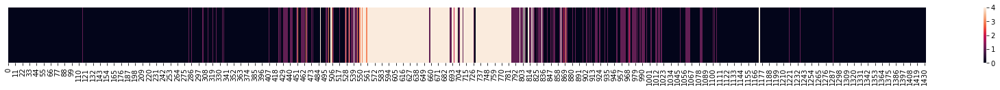

 21%|██        | 8/38 [07:57<28:33, 57.13s/it]

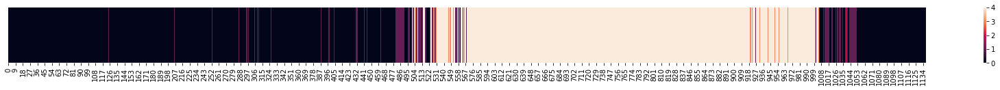

 24%|██▎       | 9/38 [08:46<26:29, 54.82s/it]

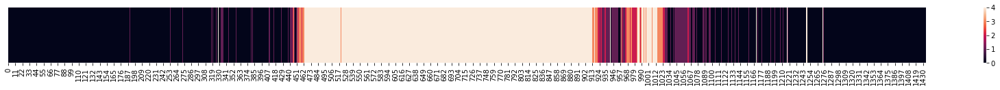

 26%|██▋       | 10/38 [09:47<26:23, 56.54s/it]

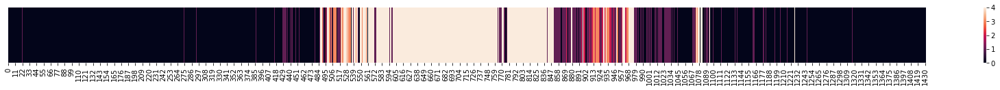

 29%|██▉       | 11/38 [10:40<24:59, 55.52s/it]

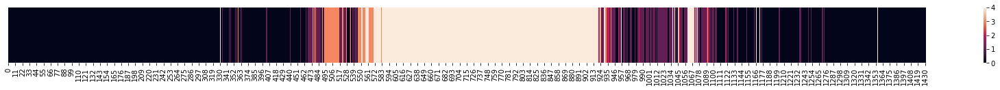

 32%|███▏      | 12/38 [11:33<23:42, 54.71s/it]

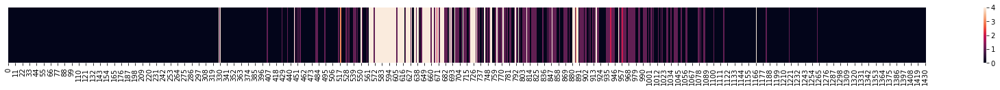

 34%|███▍      | 13/38 [12:25<22:31, 54.06s/it]

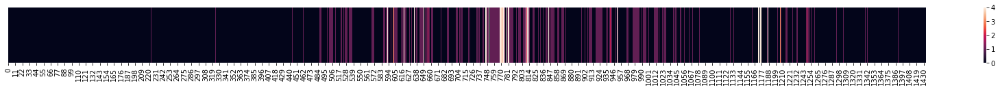

 37%|███▋      | 14/38 [13:19<21:31, 53.82s/it]

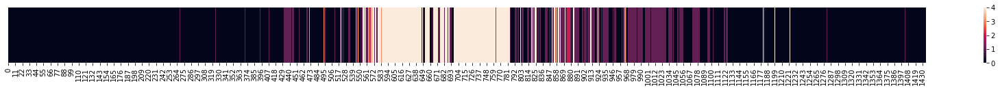

 39%|███▉      | 15/38 [14:11<20:29, 53.46s/it]

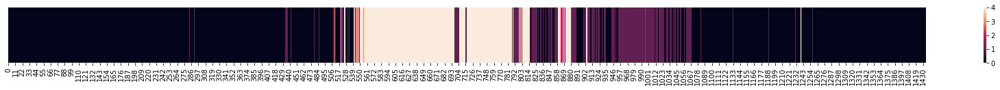

 42%|████▏     | 16/38 [15:04<19:28, 53.12s/it]

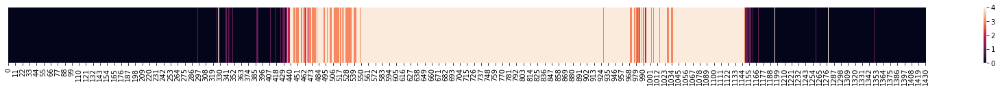

 45%|████▍     | 17/38 [15:57<18:34, 53.09s/it]

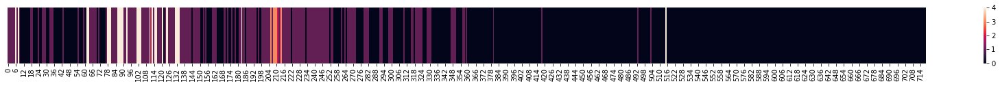

 47%|████▋     | 18/38 [16:24<15:08, 45.45s/it]

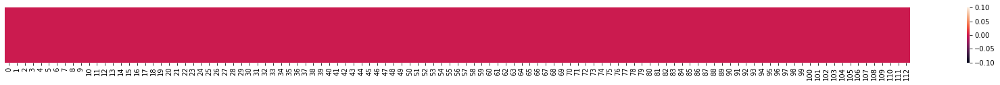

 50%|█████     | 19/38 [16:31<10:39, 33.66s/it]

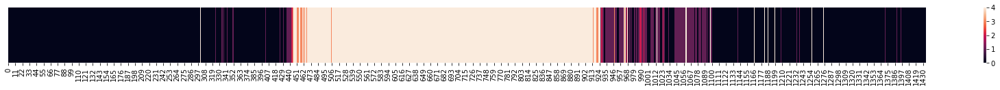

 53%|█████▎    | 20/38 [17:24<11:50, 39.46s/it]

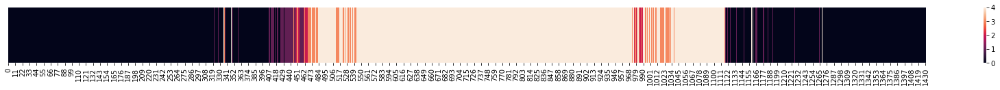

 55%|█████▌    | 21/38 [18:16<12:18, 43.42s/it]

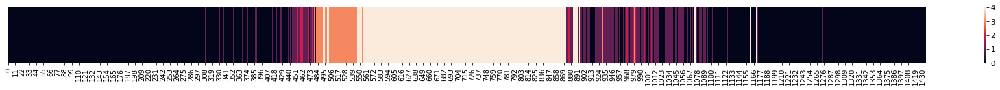

 58%|█████▊    | 22/38 [19:09<12:19, 46.23s/it]

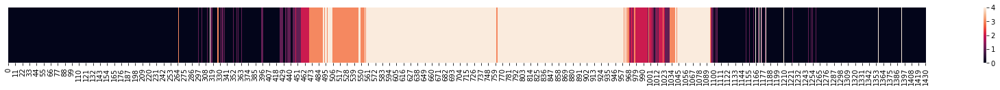

 61%|██████    | 23/38 [20:03<12:09, 48.65s/it]

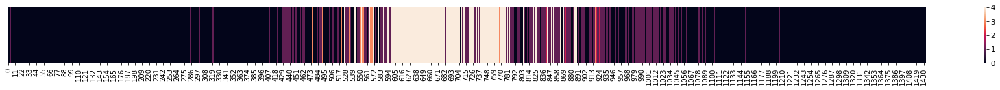

 63%|██████▎   | 24/38 [20:59<11:51, 50.85s/it]

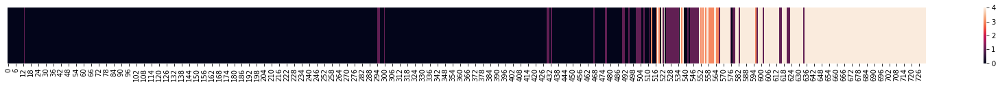

 66%|██████▌   | 25/38 [21:25<09:22, 43.26s/it]

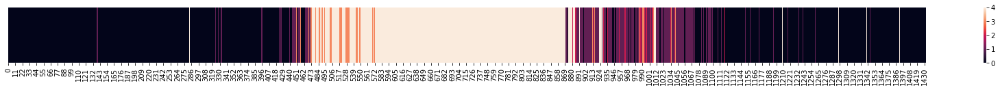

 68%|██████▊   | 26/38 [22:12<08:54, 44.54s/it]

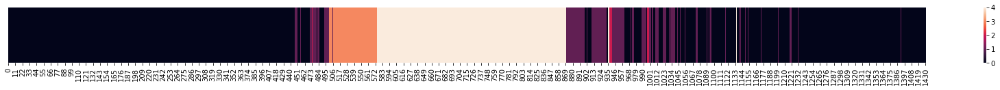

 71%|███████   | 27/38 [23:00<08:19, 45.37s/it]

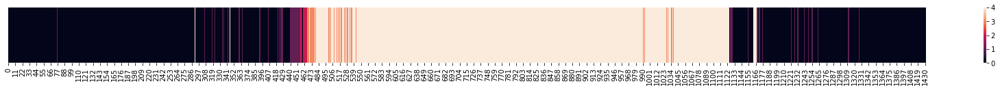

 74%|███████▎  | 28/38 [23:47<07:40, 46.04s/it]

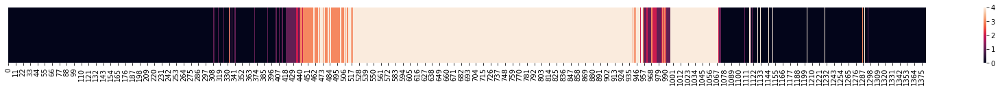

 76%|███████▋  | 29/38 [24:33<06:53, 45.96s/it]

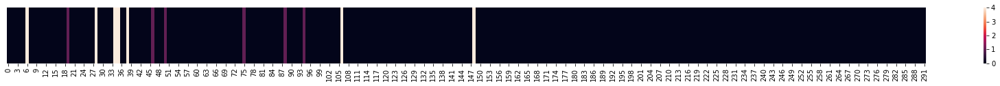

 79%|███████▉  | 30/38 [24:44<04:43, 35.47s/it]

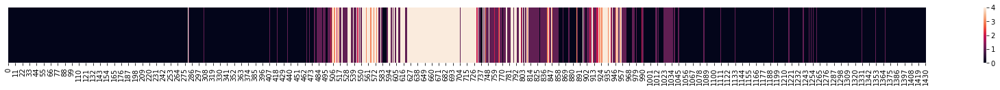

 82%|████████▏ | 31/38 [25:31<04:32, 39.00s/it]

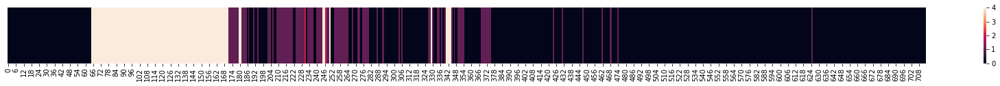

 84%|████████▍ | 32/38 [25:56<03:28, 34.67s/it]

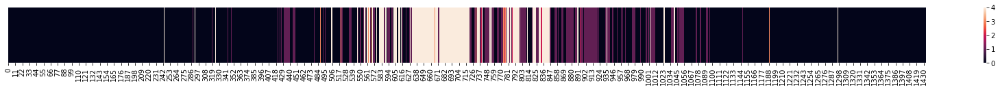

 87%|████████▋ | 33/38 [26:44<03:12, 38.58s/it]

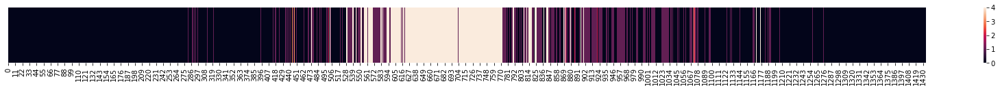

 89%|████████▉ | 34/38 [27:31<02:45, 41.27s/it]

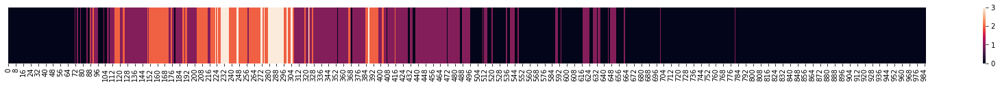

 92%|█████████▏| 35/38 [28:04<01:56, 38.88s/it]

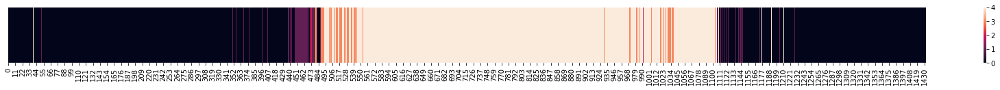

 95%|█████████▍| 36/38 [28:52<01:22, 41.50s/it]

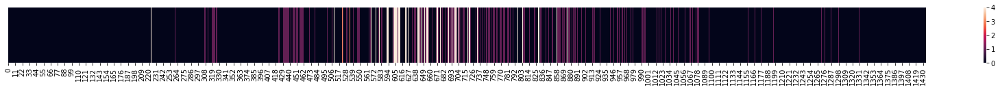

 97%|█████████▋| 37/38 [29:39<00:43, 43.28s/it]

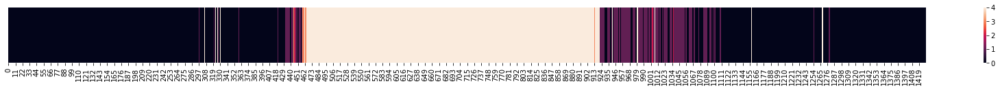

100%|██████████| 38/38 [30:26<00:00, 48.08s/it]


In [3]:
predictions = {}
core = '/home/ejoraskie/work_area/studyMachineLearning/gc_project/long'
for day in tqdm.tqdm(os.listdir(core)):
    day_predictions = []
    folder_path = os.path.join(core, day)
    for image in sorted(os.listdir(folder_path)):
        image = os.path.join(folder_path, image)
        image = keras.preprocessing.image.load_img(image, target_size=(96, 128))
        image = keras.preprocessing.image.img_to_array(image)
        image = np.expand_dims(image, axis=0)
        day_predictions.append(np.argmax(model.predict(image), axis=1))
    predictions[day] = day_predictions
    data = np.array(predictions[day]).transpose()
    plt.figure(figsize=(30, 1.5))
    sns.heatmap(data, yticklabels=False),  # , cbar_kws={"orientation": "horizontal"}
    plt.show()


In [ ]:
for item in predictions.keys():
    plt.plot(item)